In [1]:
import os
import shutil
from pathlib import Path

import yaml
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns
from PIL import Image

import numpy as np
import pandas as pd
from collections import defaultdict
from collections import Counter

### 1. Получение данных

In [2]:
from roboflow import Roboflow
rf = Roboflow(api_key="iOJNkzHKPzOLoZ0dIkM9")
project = rf.workspace("aerial-person-detection").project("aerial-person-detection")
version = project.version(3)
dataset = version.download("yolov11")

/Users/angelina/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Aerial-Person-Detection-3 in yolov11:: 100%|█|


In [3]:
current_dir = Path.cwd()
source_dir = current_dir / 'Aerial-Person-Detection-3'
destination_dir = current_dir / 'data'

destination_dir.mkdir(exist_ok=True)

shutil.move(str(source_dir), str(destination_dir / source_dir.name))

print(f'Dataset перемещен в {destination_dir / source_dir.name}')

Dataset перемещен в /Users/angelina/team_49_pedestrian_tracking/notebooks/data/Aerial-Person-Detection-3


### 2. Загрузка параметров

In [4]:
def load_classes(data_yaml_path):
    with open(data_yaml_path, 'r') as f:
        data = yaml.safe_load(f)
    return data['names']

# Выгрузим классы объектов
data_yaml_path = current_dir / 'data/Aerial-Person-Detection-3/data.yaml'
class_names = load_classes(data_yaml_path)

In [5]:
train_images_dir = current_dir / 'data/Aerial-Person-Detection-3/train/images'
train_labels_dir = current_dir / 'data/Aerial-Person-Detection-3/train/labels'
valid_images_dir = current_dir / 'data/Aerial-Person-Detection-3/valid/images'
valid_labels_dir = current_dir / 'data/Aerial-Person-Detection-3/valid/labels'

In [6]:
def get_image_names(images_dir):
    return [file.stem for file in images_dir.glob('*.jpg')]

train_images = get_image_names(train_images_dir)
valid_images = get_image_names(valid_images_dir)

# Будем проводить EDA по всем данным, поэтому объединим списки
all_images = train_images + valid_images

In [7]:
def load_bounding_boxes(image_name):
    label_file = (train_labels_dir if image_name in train_images else valid_labels_dir) / f'{image_name}.txt'
    
    boxes = []
    with open(label_file, 'r') as file:
        for line in file:
            parts = line.strip().split()
            class_id = int(parts[0])
            x_center, y_center, box_width, box_height = map(float, parts[1:5])
            boxes.append((class_id, x_center, y_center, box_width, box_height))
    return boxes

def display_image_with_boxes(image_name):
    if image_name in train_images:
        image_path = train_images_dir / f'{image_name}.jpg'
    else:
        image_path = valid_images_dir / f'{image_name}.jpg'
    
    img = Image.open(image_path)
    img_width, img_height = img.size
    fig, ax = plt.subplots(1, figsize=(10, 8))
    ax.imshow(img)
    
    boxes = load_bounding_boxes(image_name)
    
    for (class_id, x_center, y_center, box_width, box_height) in boxes:
        x_min = (x_center - box_width / 2) * img_width
        y_min = (y_center - box_height / 2) * img_height
        width = box_width * img_width
        height = box_height * img_height
        
        rect = patches.Rectangle((x_min, y_min), width, height, linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        
        class_name = class_names[class_id]
        ax.text(x_min, y_min - 5, class_name, color='red', fontsize=10, va='bottom', ha='left')
    
    plt.axis('off')
    plt.show()

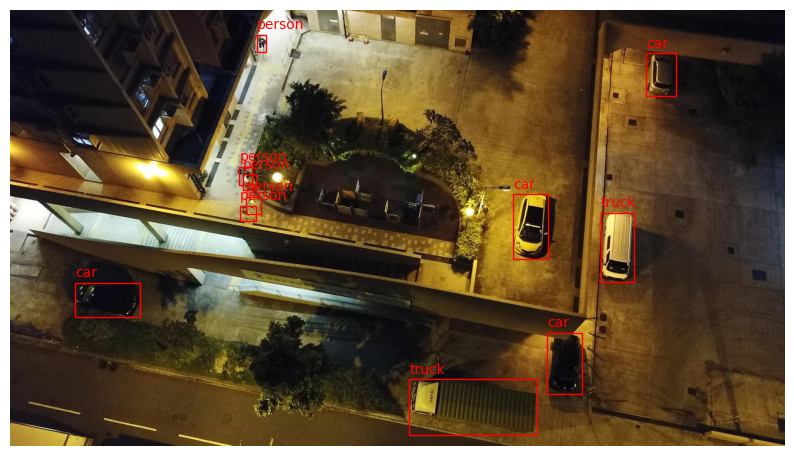

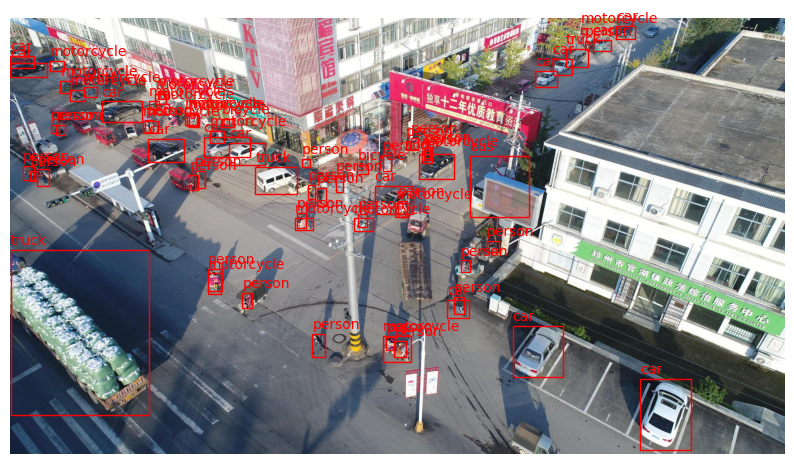

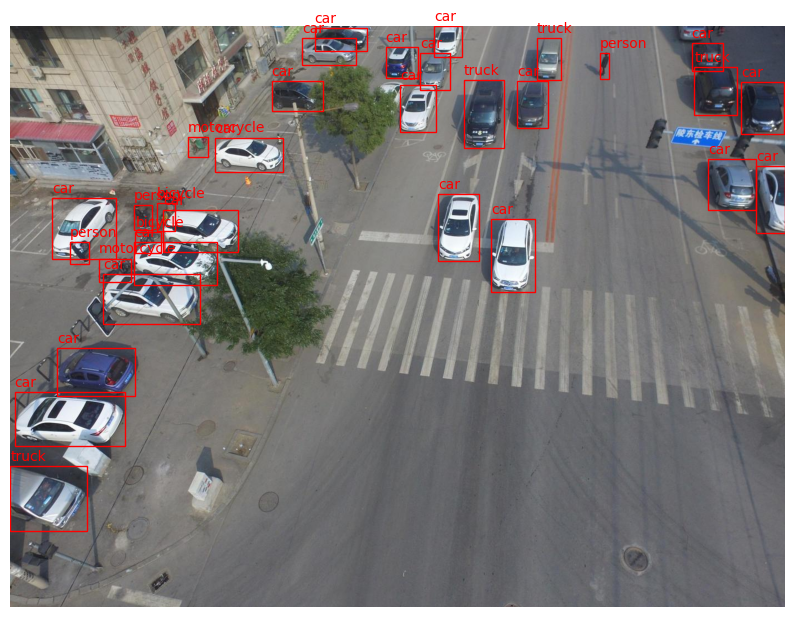

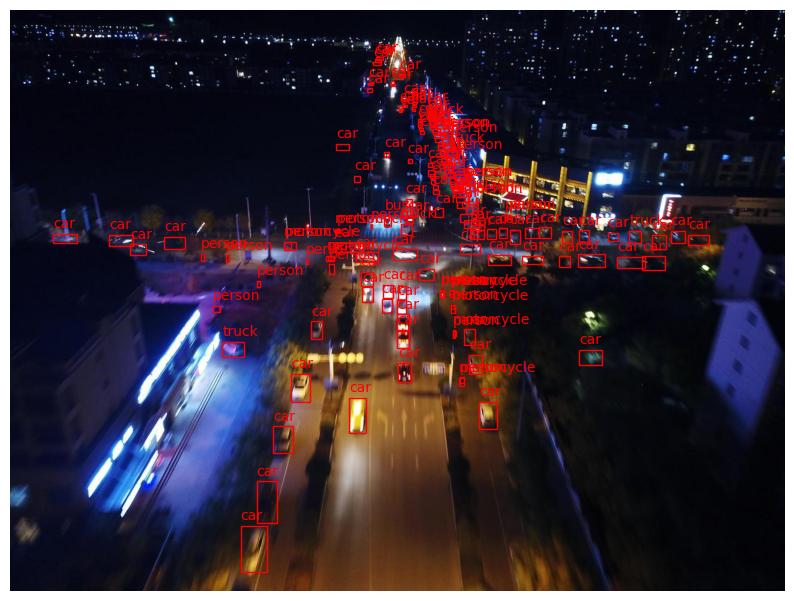

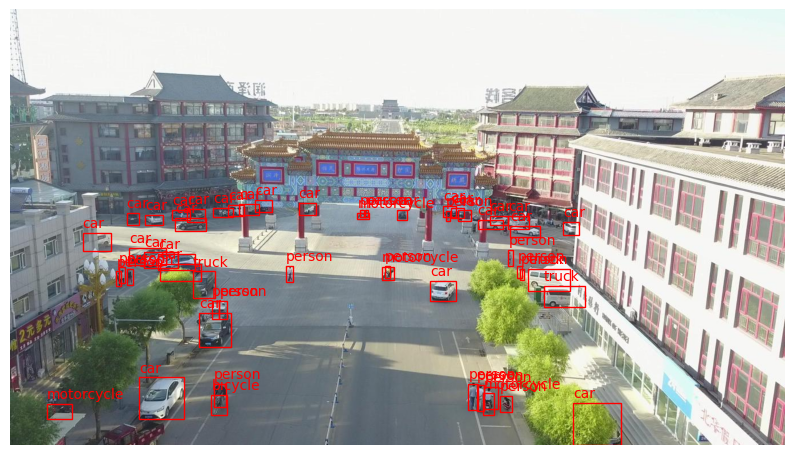

In [8]:
random_images = random.sample(all_images, 5)

for image_name in random_images:
    display_image_with_boxes(image_name)

In [9]:
person_class_id = class_names.index('person')
images_with_person = []

for image_name in all_images:
    label_file = (train_labels_dir if image_name in train_images else valid_labels_dir) / f'{image_name}.txt'
    
    if label_file.exists():
        with open(label_file, 'r') as file:
            for line in file:
                parts = line.strip().split()
                if int(parts[0]) == person_class_id:
                    images_with_person.append(image_name)
                    break

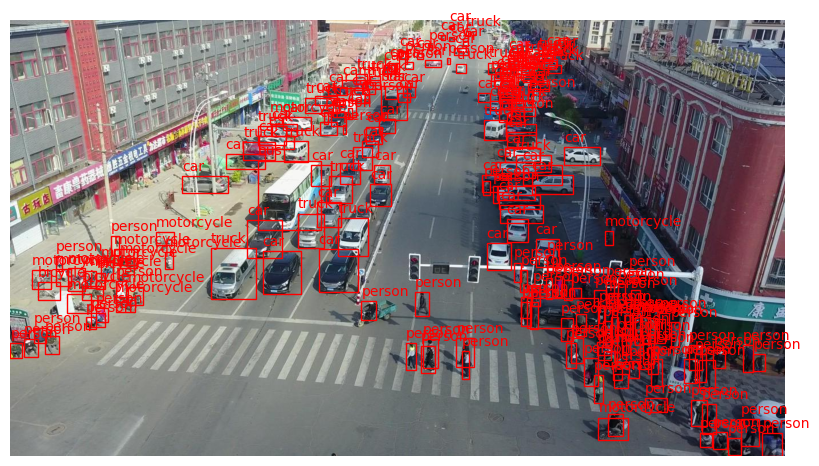

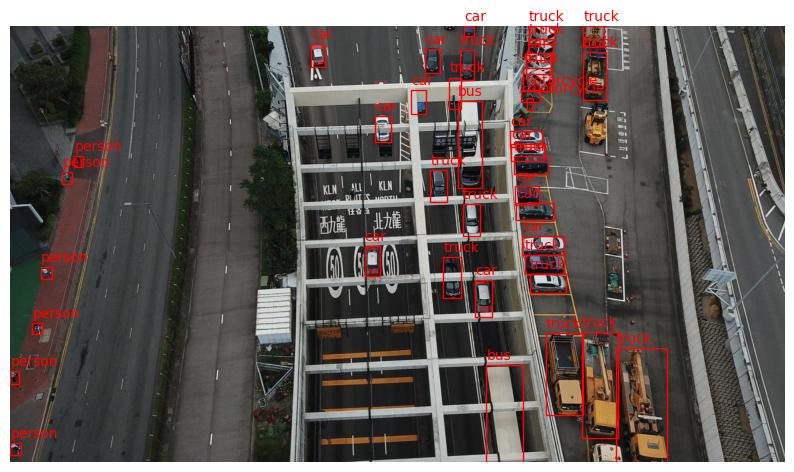

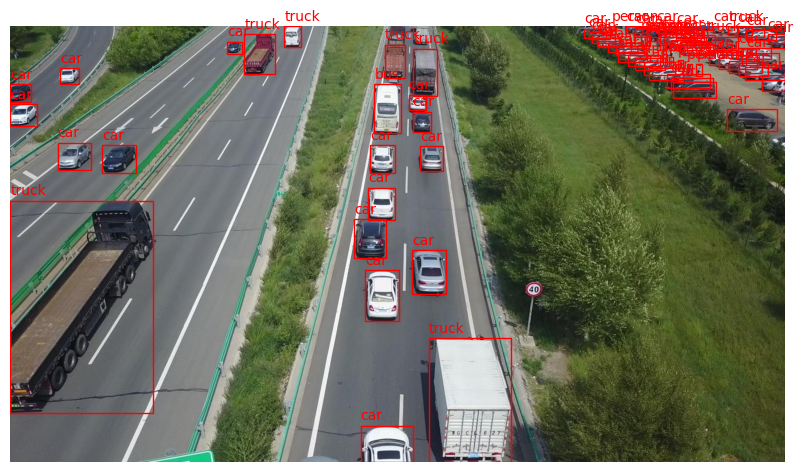

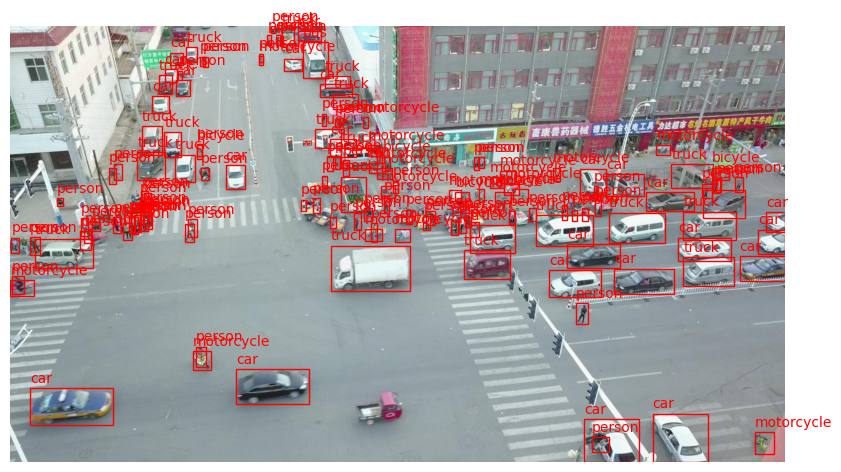

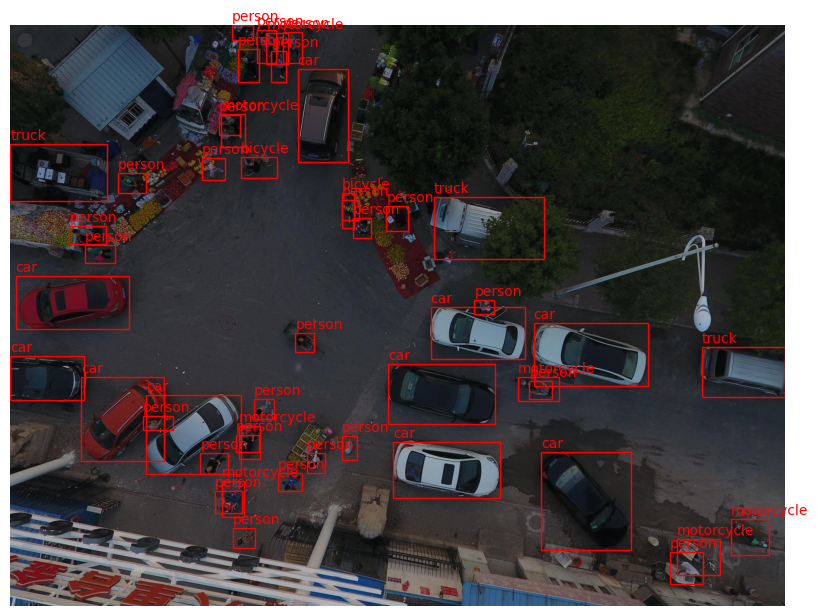

In [10]:
random_images = random.sample(images_with_person, 5)

for image_name in random_images:
    display_image_with_boxes(image_name)

### 3. EDA:
- Средний, минимальный, максимальный размеры фото / бибоксов
- Среднее отклонение по трём каналам (RGB)
- Распределение классов и меток
- Распределение размеров бибокса
- Положение бибоксов

__Размеры фото / бибоксов__

In [11]:
def get_image_size(image_names, specific_images=None):
    width_list, height_list, proportions_list, image_count = [], [], [], 0

    images_to_process = specific_images if specific_images is not None else image_names
    
    for image_file in images_to_process:
        if image_file in train_images:
            image_path = train_images_dir / f'{image_file}.jpg'
        else:
            image_path = valid_images_dir / f'{image_file}.jpg'
            
        try:
            with Image.open(image_path) as img:
                width, height = img.size
                width_list.append(width)
                height_list.append(height)
                proportions_list.append(width / height)
                image_count += 1
        except Exception as e:
            print(f'Ошибка при обработке файла {image_file}: {e}')
            continue

    if image_count == 0:
        return 0, 0, 0

    img_size_stats = {
        'avg_width': round(np.array(width_list).mean()),
        'avg_height': round(np.array(height_list).mean()),
        'avg_proportion': round(np.array(proportions_list).mean(),2),
        'min_width': np.array(width_list).min(),
        'min_height': np.array(height_list).min(),
        'min_proportion': round(np.array(proportions_list).min(),2),
        'max_width': np.array(width_list).max(),
        'max_height': np.array(height_list).max(),
        'max_proportion': round(np.array(proportions_list).max(),2),
        'image_count': image_count
    }
    
    return img_size_stats, width_list, height_list, proportions_list

In [13]:
all_img_size_stats, all_width_list, all_height_list, all_proportions_list = get_image_size(all_images)
all_img_size_stats

{'avg_width': 1503,
 'avg_height': 982,
 'avg_proportion': 1.57,
 'min_width': 480,
 'min_height': 360,
 'min_proportion': 1.33,
 'max_width': 2000,
 'max_height': 1500,
 'max_proportion': 1.78,
 'image_count': 6990}

Посмотрим ту же самую статистику по фото, где есть класс с людьми

In [14]:
person_img_size_stats, person_width_list, person_height_list, person_proportions_list = get_image_size(all_images, images_with_person)
person_img_size_stats

{'avg_width': 1504,
 'avg_height': 987,
 'avg_proportion': 1.56,
 'min_width': 480,
 'min_height': 360,
 'min_proportion': 1.33,
 'max_width': 2000,
 'max_height': 1500,
 'max_proportion': 1.78,
 'image_count': 6186}

In [15]:
all_img_count = all_img_size_stats.get('image_count')
person_img_count = person_img_size_stats.get('image_count')
print(f'Люди присутствуют на {round(person_img_count/all_img_count,2)*100}% изображений')

Люди присутствуют на 88.0% изображений


- Фото имеют разный размер (и отношение сторон не 1 к 1) – перед применением модели на датасете, нужно будет провести ресайз
- Тк. на большей части фото присутствуют люди, средние размеры всего датасета не сильно отличаются от размера изображений с обязательным присутствием людей. Посмотрим на распределение размеров по группам (есть люди на фото / нет людей), чтобы убедиться, что между ними нет смещений

In [16]:
def save_image(fig, file_name):
    output_dir = 'output/eda_vizualizations'
    output_path = Path.cwd() / output_dir
    output_path.mkdir(parents=True, exist_ok=True)
    
    save_path = output_path / file_name
    fig.savefig(save_path, format='jpg', dpi=300)  

In [17]:
def get_grouped_hist(group_x_data, group_y_data, group_x_name, group_y_name, var_name, figsize=(7, 5), bins=10):
    fig, ax = plt.subplots(figsize=figsize)

    ax.hist(group_x_data, bins=bins, alpha=0.6, label=f'Image {var_name} {group_x_name}', color='blue', edgecolor='white', zorder=2)
    ax.hist(group_y_data, bins=bins, alpha=0.7, label=f'Image {var_name} {group_y_name}', color='forestgreen', edgecolor='white', zorder=2)
    ax.set_xlabel(f'Image {var_name}')
    ax.set_ylabel('Image Count')
    ax.set_title(f'Distribution of Image {var_name} by Groups')
    ax.legend().set_zorder(3)
    ax.grid(axis='y', color='gray', linestyle='--', linewidth=0.5, alpha=0.5, zorder=1)

    file_name = f'{var_name}_distribution_grouped_by_{group_x_name}.jpg'
    save_image(fig, file_name)
    
    plt.show()

In [19]:
images_wo_person = [img for img in all_images if img not in (images_with_person or [])]

no_person_img_size_stats, no_person_width_list, no_person_height_list, no_person_proportions_list \
    = get_image_size(all_images, images_wo_person)

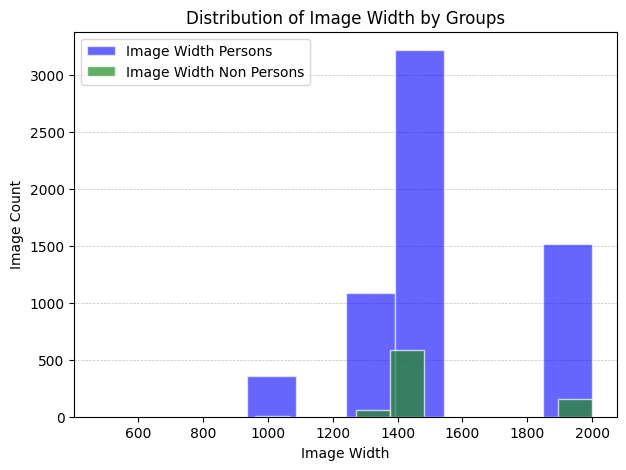

In [20]:
get_grouped_hist(
    person_width_list,
    no_person_width_list,
    'Persons',
    'Non Persons',
    'Width'
    )

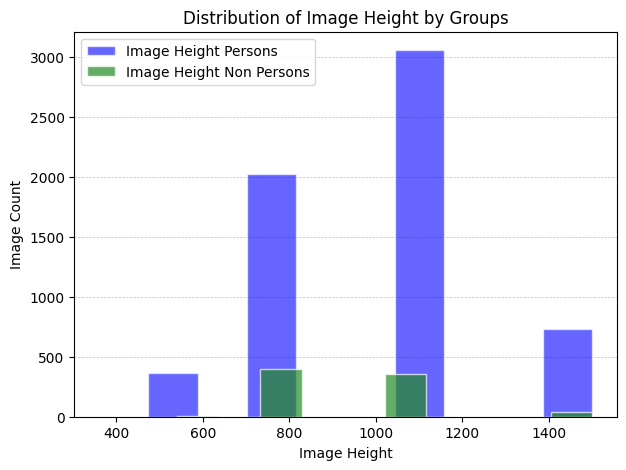

In [21]:
get_grouped_hist(
    person_height_list,
    no_person_height_list,
    'Persons',
    'Non Persons',
    'Height'
    )

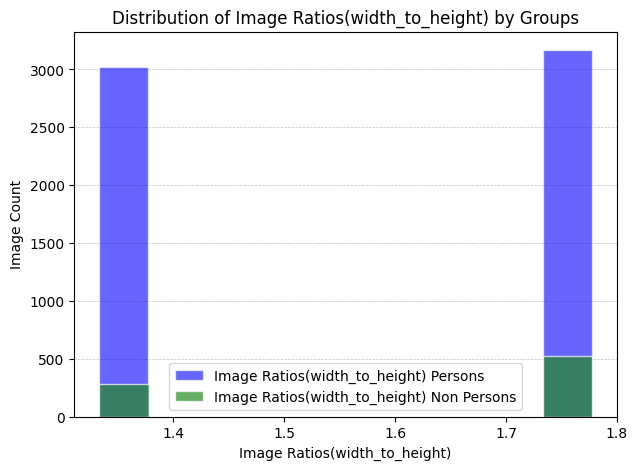

In [22]:
get_grouped_hist(
    person_proportions_list,
    no_person_proportions_list,
    'Persons',
    'Non Persons',
    'Ratios(width_to_height)'
    )

- Фотографий без людей сильно меньше, но для нашей задачи этот дисбаланс не является проблемой, цель проекта – детекция и трекинг людей в местах массового скопления. Отметим, что это просто положительный момент для обучения, что будут встречаться наблюдения без людей (должны препятствовать переобучению)
- Распределения размеров и пропорций в группах изображений с людьми и без – одинаковые. Изображения должны быть похожего качества, что также характеризует датасет положительно, чтобы дальше обучаться на нем

In [23]:
def get_bbox_size_stats(image_names, specific_images=None):
    bbox_width_list, bbox_height_list, bbox_proportions_list, bbox_count = [], [], [], 0

    images_to_process = specific_images if specific_images is not None else image_names
    
    for image_file in images_to_process:
        if image_file in train_images:
            label_path = train_labels_dir / f'{image_file}.txt'
            image_path = train_images_dir / f'{image_file}.jpg'
        else:
            label_path = valid_labels_dir / f'{image_file}.txt'
            image_path = valid_images_dir / f'{image_file}.jpg'
            
        try:
            with Image.open(image_path) as img:
                img_width, img_height = img.size

            with open(label_path, 'r') as file:
                for line in file:
                    parts = line.strip().split()
                    class_id, x_center, y_center, width, height = map(float, parts[:5])
                
                    bbox_width = width * img_width
                    bbox_height = height * img_height
                    bbox_proportion = bbox_width / bbox_height if bbox_height != 0 else 0
                    
                    bbox_width_list.append(bbox_width)
                    bbox_height_list.append(bbox_height)
                    bbox_proportions_list.append(bbox_proportion)
                    bbox_count += 1
        except Exception as e:
            print(f'Ошибка при обработке файла {label_path}: {e}')
            continue

    if bbox_count == 0:
        return 0, 0, 0

    bbox_size_stats = {
        'avg_bbox_width': round(np.array(bbox_width_list).mean(), 2),
        'avg_bbox_height': round(np.array(bbox_height_list).mean(), 2),
        'avg_bbox_proportion': round(np.array(bbox_proportions_list).mean(), 2),
        'min_bbox_width': np.array(bbox_width_list).min(),
        'min_bbox_height': np.array(bbox_height_list).min(),
        'min_bbox_proportion': round(np.array(bbox_proportions_list).min(), 2),
        'max_bbox_width': np.array(bbox_width_list).max(),
        'max_bbox_height': np.array(bbox_height_list).max(),
        'max_bbox_proportion': round(np.array(bbox_proportions_list).max(), 2),
        'bbox_count': bbox_count
    }
    
    return bbox_size_stats, bbox_width_list, bbox_height_list, bbox_proportions_list

In [24]:
all_bbox_size_stats, all_bbox_width_list, all_bbox_height_list, all_bbox_proportions_list = get_bbox_size_stats(all_images)
all_bbox_size_stats

{'avg_bbox_width': 37.69,
 'avg_bbox_height': 36.72,
 'avg_bbox_proportion': 1.08,
 'min_bbox_width': 1.9999999999999998,
 'min_bbox_height': 1.0,
 'min_bbox_proportion': 0.11,
 'max_bbox_width': 983.0,
 'max_bbox_height': 789.9999999999999,
 'max_bbox_proportion': 12.54,
 'bbox_count': 370324}

__Среднее отклонение по трём каналам (RGB)__

In [25]:
def get_channel_std(image_names):
    red_channel_std, green_channel_std, blue_channel_std = [], [], []

    for image_name in image_names:
        if image_name in train_images:
            image_path = train_images_dir / f'{image_name}.jpg'
        else:
            image_path = valid_images_dir / f'{image_name}.jpg'
            
        try:
            with Image.open(image_path) as img:
                img_array = np.array(img)
                
                red_channel_std.append(img_array[:, :, 0].std())
                green_channel_std.append(img_array[:, :, 1].std())
                blue_channel_std.append(img_array[:, :, 2].std())
                
        except Exception as e:
            print(f'Ошибка при обработке файла {image_name}: {e}')
            continue
    
    avg_red_std = np.mean(red_channel_std)
    avg_green_std = np.mean(green_channel_std)
    avg_blue_std = np.mean(blue_channel_std)
    
    channel_std_stats = {
        'avg_red_std': round(avg_red_std, 2),
        'avg_green_std': round(avg_green_std, 2),
        'avg_blue_std': round(avg_blue_std, 2)
    }
    
    return channel_std_stats

In [26]:
channel_std_stats = get_channel_std(all_images)
channel_std_stats

{'avg_red_std': 48.79, 'avg_green_std': 46.61, 'avg_blue_std': 49.54}

Каналы имеют сравнительно близкое значение и умеренную контрастность. Нельзя сказать о явном преобладании одного из цветов

__Распределение классов и меток__

In [27]:
class_image_count = defaultdict(int)
class_bbox_count = defaultdict(int)

for image_name in all_images:
    label_file = (train_labels_dir if image_name in train_images else valid_labels_dir) / f'{image_name}.txt'
    
    classes_in_image = set()
    
    try:
        with open(label_file, 'r') as file:
            for line in file:
                parts = line.strip().split()
                class_id = int(parts[0])
                class_name = class_names[class_id]
                
                class_bbox_count[class_name] += 1

                if class_name not in classes_in_image:
                    class_image_count[class_name] += 1
                    classes_in_image.add(class_name)
                    
    except Exception as e:
        print(f'Ошибка при обработке файла {image_name}: {e}')
        continue

In [28]:
class_image_count

defaultdict(int,
            {'truck': 5895,
             'person': 6186,
             'car': 6620,
             'bicycle': 3101,
             'motorcycle': 4699,
             'bus': 2147})

In [29]:
class_bbox_count

defaultdict(int,
            {'truck': 40363,
             'person': 119838,
             'car': 157819,
             'bicycle': 11714,
             'motorcycle': 34423,
             'bus': 6167})

In [30]:
def plot_distribution(data, metric_name):
    classes = list(data.keys())
    counts = list(data.values())
    
    plt.figure(figsize=(7, 5))
    plt.bar(classes, counts, color='blue', edgecolor='white')
    
    plt.xlabel('Class')
    plt.ylabel(f'{metric_name}')
    plt.title(f'Distribution of {metric_name} per Class')
    plt.xticks(rotation=45, ha='right')
    
    plt.tight_layout()
    plt.grid(axis='y', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
    plt.show()

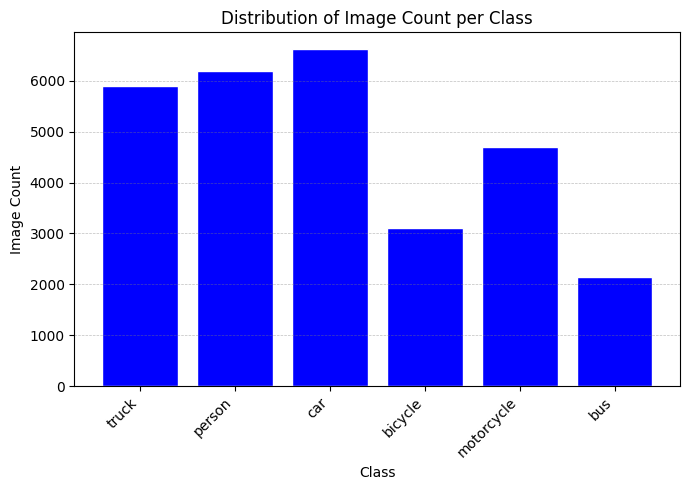

In [31]:
plot_distribution(
    class_image_count,
    'Image Count'
)

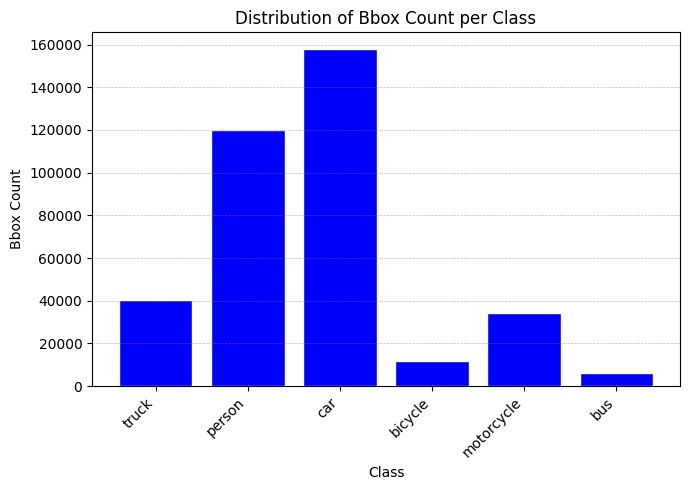

In [32]:
plot_distribution(
    class_bbox_count,
    'Bbox Count'
)

In [33]:
total_bboxes_data = []
person_bboxes_data = []

for image_name in all_images:
    label_file = (train_labels_dir if image_name in train_images else valid_labels_dir) / f'{image_name}.txt'
    
    total_bboxes = 0
    person_bboxes = 0
    
    try:
        with open(label_file, 'r') as file:
            for line in file:
                parts = line.strip().split()
                class_id = int(parts[0])
                class_name = class_names[class_id]
                total_bboxes += 1
                
                if class_name == "person":
                    person_bboxes += 1
                    
        total_bboxes_data.append(total_bboxes)
        person_bboxes_data.append(person_bboxes)
    
    except Exception as e:
        print(f'Ошибка при обработке файла {image_name}: {e}')
        continue

In [34]:
avg_bbox_count = np.array(total_bboxes_data).mean()
avg_person_count = np.array(person_bboxes_data).mean()
print(f'Среднее число bbox на фото: {round(avg_bbox_count)} \nСреднее число людей на фото: {round(avg_person_count)}')

Среднее число bbox на фото: 53 
Среднее число людей на фото: 17


Самое большое число изображений и бибоксов в разрезе класса принадлежит автомобилям, за ним – люди. БОльшая часть снимков датасета собрана на дорогах, поэтому такое распределение классов понятно.

В среднем число людей на фото меньше совокупного числа других размеченных объектов

In [35]:
def plot_hist(data, metric_name):
    plt.figure(figsize=(7, 5))
    plt.hist(data, bins=100, color='blue', edgecolor='white')
    
    plt.xlabel(f'{metric_name} per Image')
    plt.ylabel('Frequency')
    plt.title(f'Distribution of {metric_name} per Image')
    plt.xticks(rotation=45, ha='right')
    
    plt.tight_layout()
    plt.grid(axis='y', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
    plt.show()

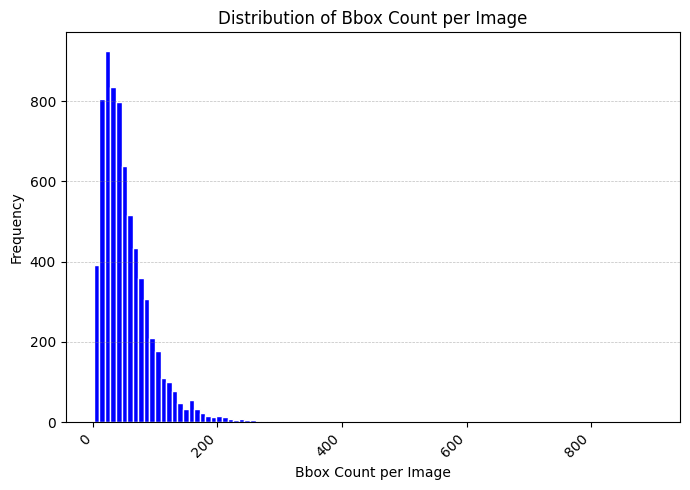

In [36]:
plot_hist(total_bboxes_data, 'Bbox Count')

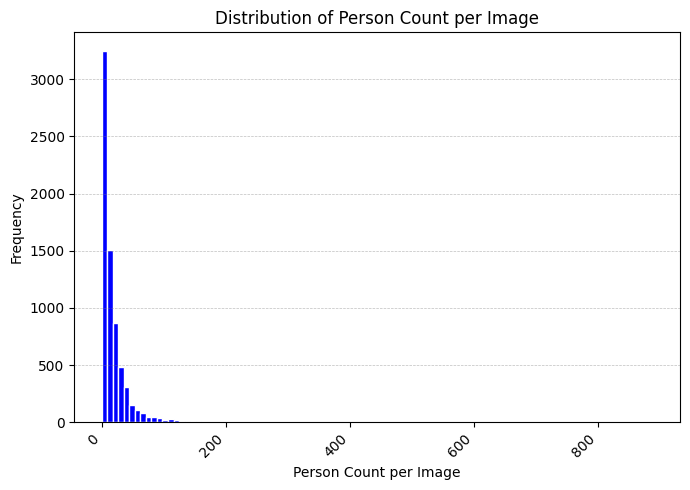

In [37]:
plot_hist(person_bboxes_data, 'Person Count')

Распределение бибоксов логнормальное — на фото мы увидем сразу несколько размеченных объектов, а не один.

Распределение числа людей имеет логарифмическую форму с длинным хвостом – основная часть снимков низкоплотные по классу Person, но должны встречаться и снимки очень людных мест.

Выведем изображения с большим числом задекченных людей, чтобы убедиться, что это не выброс

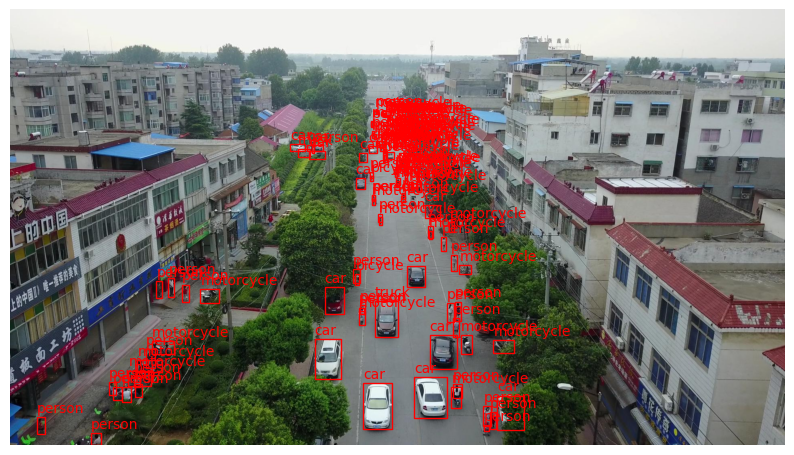

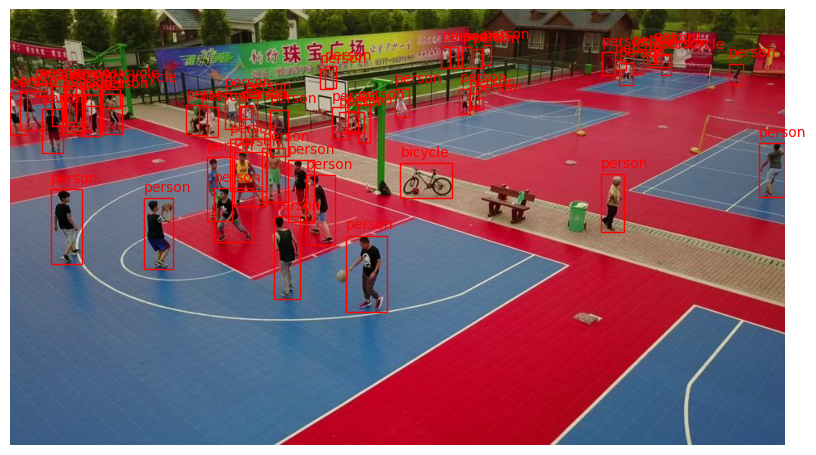

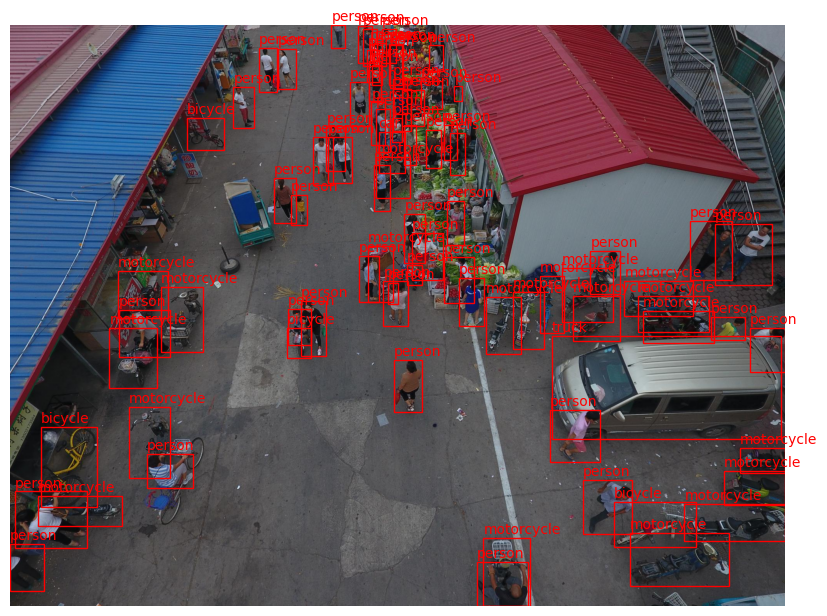

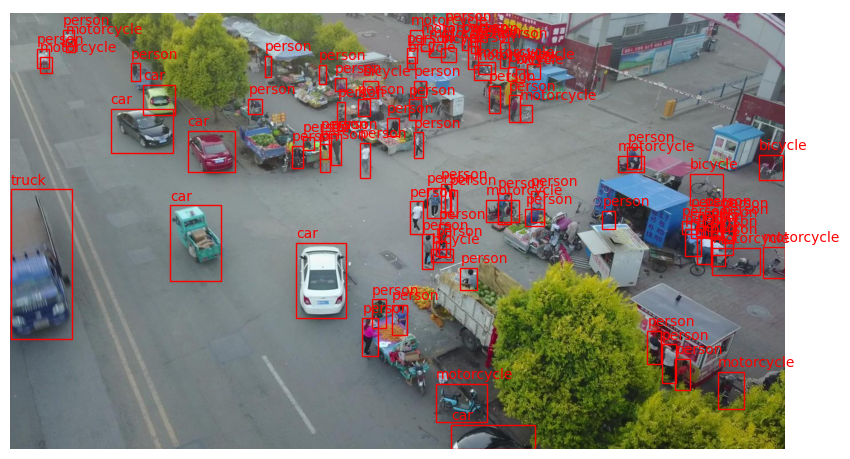

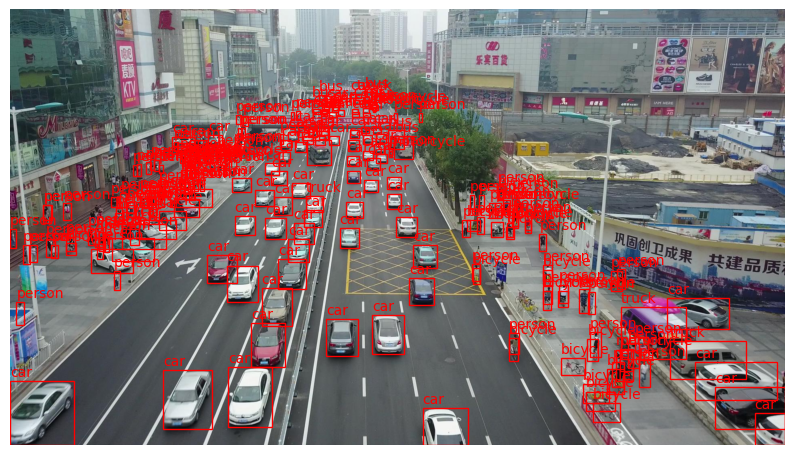

In [38]:
images_with_many_person_bboxes = [image_name for image_name, person_bboxes in zip(all_images, person_bboxes_data) \
                                  if person_bboxes > 50 and person_bboxes < 200]

random_images = random.sample(images_with_many_person_bboxes, 5)

for image_name in random_images:
    display_image_with_boxes(image_name)

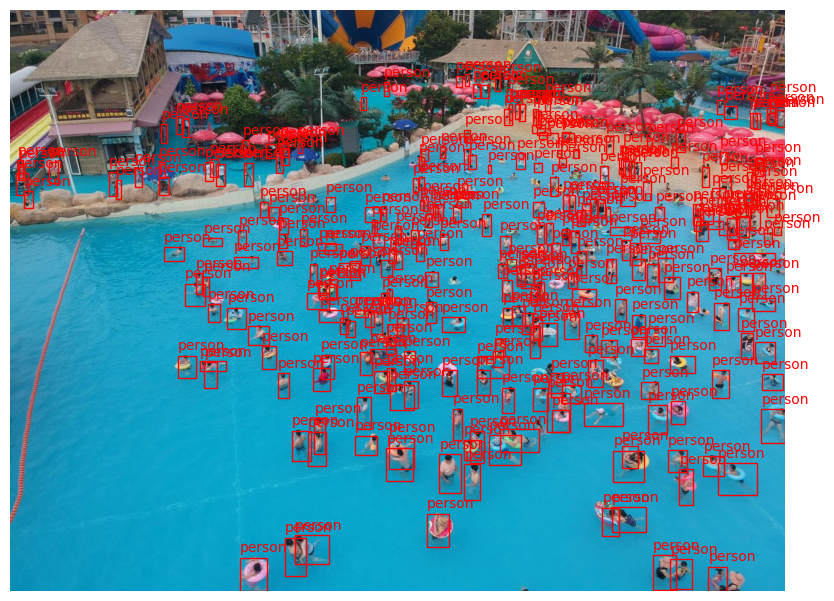

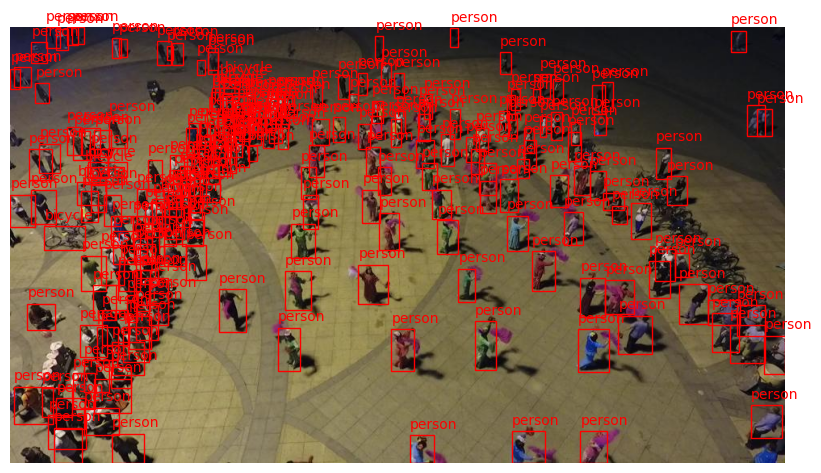

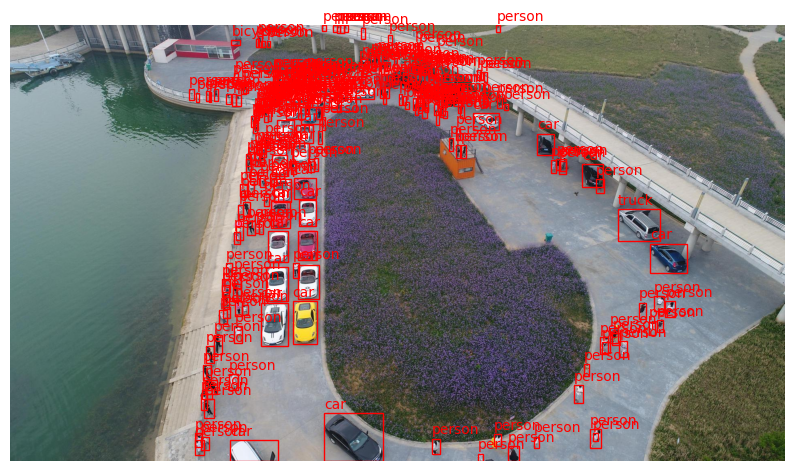

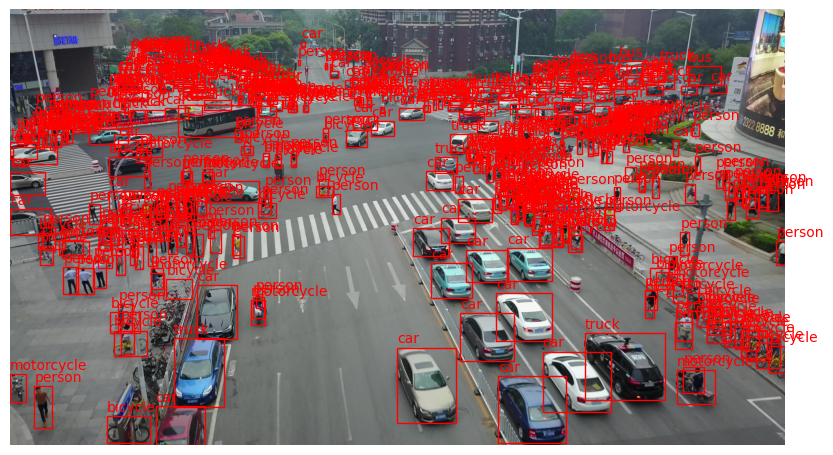

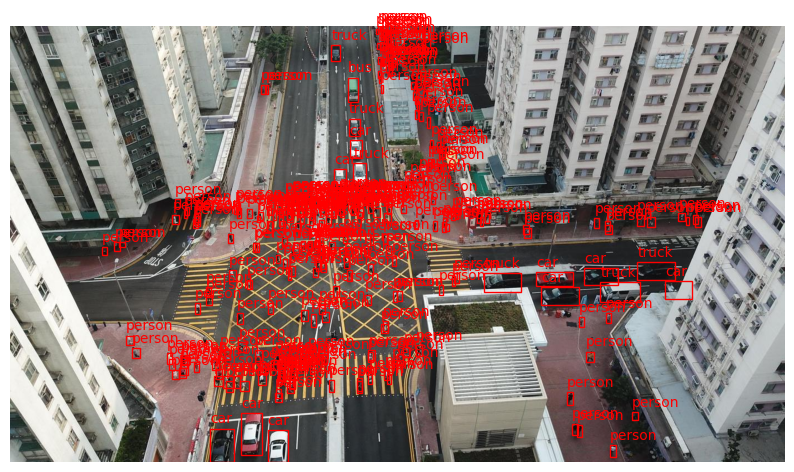

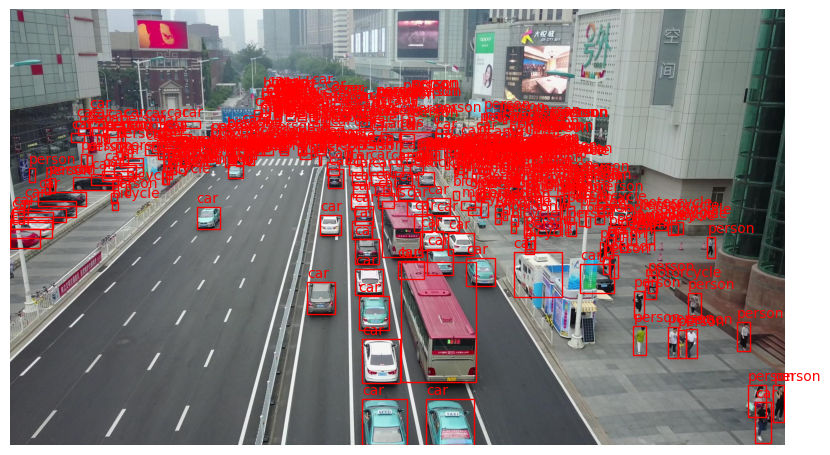

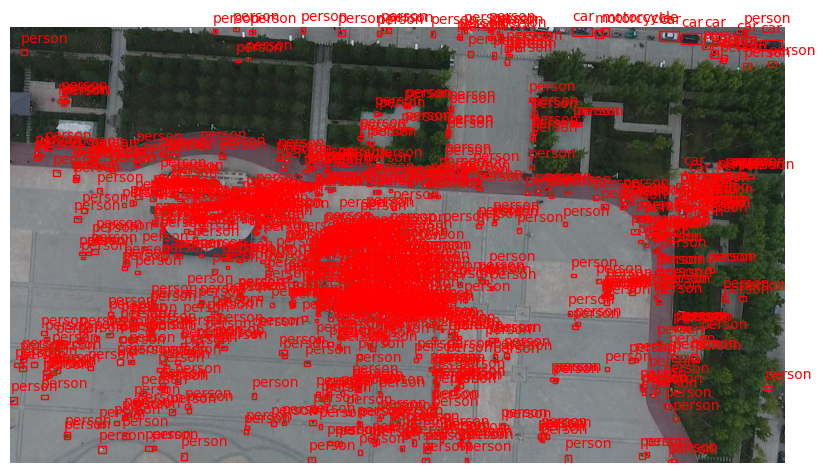

In [39]:
images_with_many_person_bboxes = [image_name for image_name, person_bboxes in zip(all_images, person_bboxes_data) if person_bboxes > 200]

for image_name in images_with_many_person_bboxes:
    display_image_with_boxes(image_name)

Снимки из хвоста частотного распределения — это снимки людных мест с очень большой высоты. Их можно будет исключить из выборки 

__Распределение размеров бибокса__

Посмотрим, как распределяется площадь бибоксов по классам объектов и в рамках класса Person

In [40]:
bbox_area_by_class = defaultdict(list)

for image_name in all_images:
    label_file = (train_labels_dir if image_name in train_images else valid_labels_dir) / f'{image_name}.txt'
    image_path = train_images_dir / f'{image_name}.jpg' if image_name in train_images else valid_images_dir / f'{image_name}.jpg'
    
    try:
        with Image.open(image_path) as img:
            img_width, img_height = img.size
            
            with open(label_file, 'r') as file:
                for line in file:
                    parts = line.strip().split()
                    class_id = int(parts[0])
                    class_name = class_names[class_id]
                    
                    x_center, y_center, box_width, box_height = map(float, parts[1:5])
                    box_width_pixels = box_width * img_width
                    box_height_pixels = box_height * img_height
                    
                    bbox_area = box_width_pixels * box_height_pixels
                    bbox_area_by_class[class_name].append(bbox_area)
                    
    except Exception as e:
        print(f'Ошибка при обработке файла {image_name}: {e}')
        continue

In [41]:
avg_bbox_area_by_class = {class_name: np.mean(areas) for class_name, areas in bbox_area_by_class.items()}

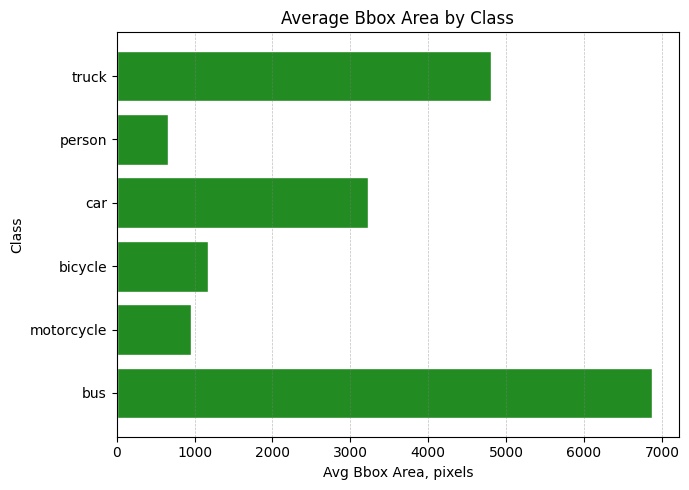

In [42]:
classes = list(avg_bbox_area_by_class.keys())
average_areas = list(avg_bbox_area_by_class.values())

plt.figure(figsize=(7, 5))
plt.barh(classes, average_areas, color='forestgreen', edgecolor='white')
plt.xlabel('Avg Bbox Area, pixels')
plt.ylabel('Class')
plt.title('Average Bbox Area by Class')
plt.gca().invert_yaxis()
plt.grid(axis='x', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)

plt.tight_layout()
plt.show()

Из всех размеченных классов в датасете, бибоксы с людьми занимают самую маленькую площадь. Это ожидаемо, т.к. остальные классы – это транспортные средства, которые очевидно крупнее

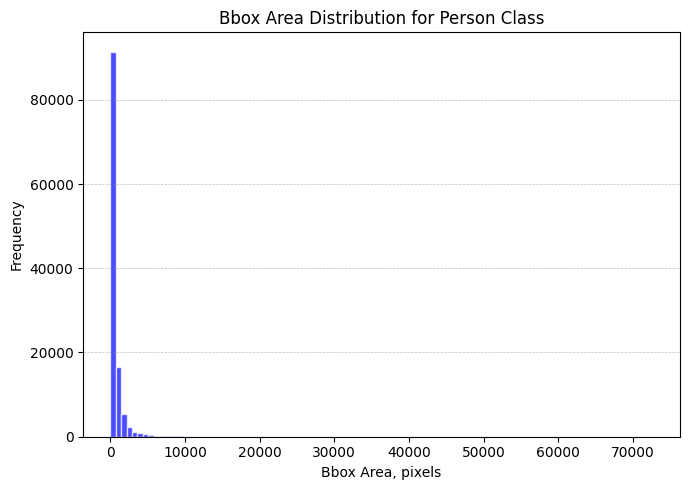

In [43]:
person_areas = bbox_area_by_class.get("person", [])

plt.figure(figsize=(7, 5))
plt.hist(person_areas, bins=100, alpha=0.7, color='blue', edgecolor='white')
plt.title('Bbox Area Distribution for Person Class')
plt.xlabel('Bbox Area, pixels')
plt.ylabel('Frequency')
plt.grid(axis='y', color='gray', linestyle='--', linewidth=0.5, alpha=0.5)

plt.tight_layout()
plt.show()

Распределение площади бибоксов с людьми логарифмическое. БОльшая часть значений сосредоточена около 0 – для нас это значит, что в датасете больше снимков с высоты / издалека, чем с близкого расстояния

__Положение бибоксов__

In [44]:
def get_left_right_dist(image_names, specific_classes=None):
    left_count = 0
    right_count = 0
    
    for image_name in image_names:
        
        label_file = (train_labels_dir if image_name in train_images else valid_labels_dir) / f'{image_name}.txt'
        image_file = (train_images_dir if image_name in train_images else valid_images_dir) / f'{image_name}.jpg'

        try:
            with open(label_file, 'r') as file:
                
                with Image.open(image_file) as img:
                    img_width = img.size[0]
                    middle_x = img_width / 2

                for line in file:
                    parts = line.strip().split()
                    class_id = int(parts[0])
                    class_name = class_names[class_id]
                    
                    if specific_classes is not None and class_name not in specific_classes:
                        continue

                    x_center_norm = float(parts[1])
                    x_center = x_center_norm * img_width
                    
                    if x_center < middle_x:
                        left_count += 1
                    else:
                        right_count += 1

        except Exception as e:
            print(f'Ошибка при обработке файла {label_file}: {e}')
            continue

    return left_count, right_count

In [45]:
bbox_all_left, bbox_all_right = get_left_right_dist(all_images)
print(f'По всем классам слева от центра изображения находится {bbox_all_left} бибоксов, справа – {bbox_all_right}')

По всем классам слева от центра изображения находится 190583 бибоксов, справа – 179741


In [46]:
bbox_person_left, bbox_person_right = get_left_right_dist(images_with_person, specific_classes=['person'])
print(f'По классу Person слева от центра изображения находится {bbox_person_left} бибоксов, справа – {bbox_person_right}')

По классу Person слева от центра изображения находится 61052 бибоксов, справа – 58786


In [47]:
round((bbox_person_left / bbox_person_right - 1)*100, 2)

3.85

На ~4% больше бибоксов с людьми находится слева от центра изображения, чем справа. Можно будет учесть это при аугментации

In [48]:
def get_bboxes_heatmap(image_names, image_shape=(500, 500), specific_classes=None):
    heatmap = np.zeros(image_shape, dtype=np.float32)

    for image_name in image_names:
        
        label_file = (train_labels_dir if image_name in train_images else valid_labels_dir) / f'{image_name}.txt'
        image_file = (train_images_dir if image_name in train_images else valid_images_dir) / f'{image_name}.jpg'

        try:
            with Image.open(image_file) as img:
                img_width, img_height = img.size

            with open(label_file, 'r') as file:
                for line in file:
                    parts = line.strip().split()
                    class_id = int(parts[0])
                    class_name = class_names[class_id]
                    x_center_norm, y_center_norm, width_norm, height_norm = map(float, parts[1:5])

                    if specific_classes is not None and class_name not in specific_classes:
                        continue

                    x_center = x_center_norm * img_width
                    y_center = y_center_norm * img_height
                    box_width = width_norm * img_width
                    box_height = height_norm * img_height

                    xmin = int(x_center - box_width / 2)
                    ymin = int(y_center - box_height / 2)
                    xmax = int(x_center + box_width / 2)
                    ymax = int(y_center + box_height / 2)

                    x_start = int((xmin / img_width) * image_shape[1])
                    y_start = int((ymin / img_height) * image_shape[0])
                    x_end = int((xmax / img_width) * image_shape[1])
                    y_end = int((ymax / img_height) * image_shape[0])

                    heatmap[y_start:y_end, x_start:x_end] += 1

        except Exception as e:
            print(f'Ошибка при обработке файла {label_file}: {e}')
            continue

    return heatmap

In [49]:
def plot_hitmap(hitmap_matrix, metric_name):
    
    plt.figure(figsize=(10, 8))
    sns.heatmap(hitmap_matrix, cmap='hot', cbar=True)
    plt.title(f'Heatmap of {metric_name} Position')
    plt.xlabel('Width')
    plt.ylabel('Height')
    plt.show()

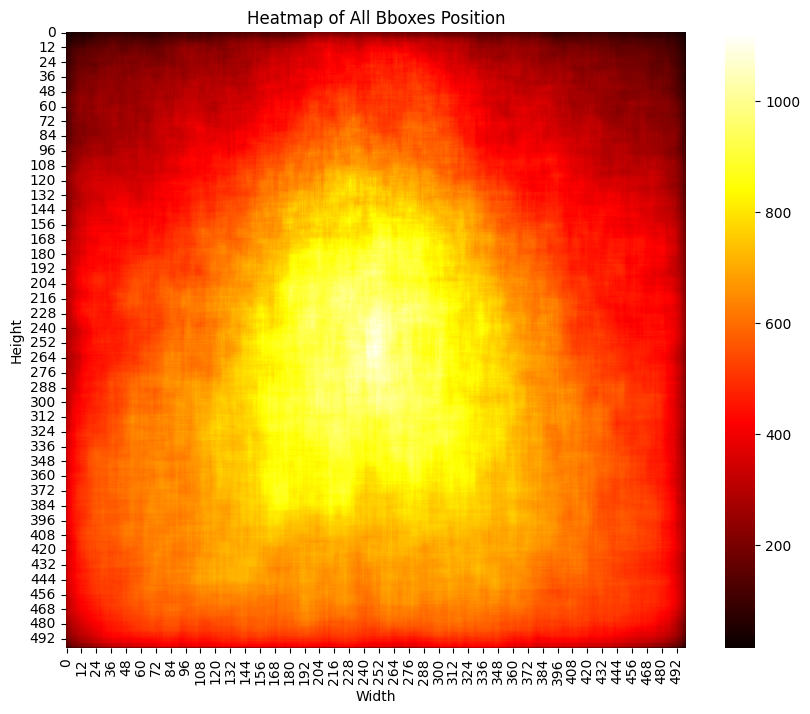

In [50]:
heatmap_all =get_bboxes_heatmap(all_images) 

plot_hitmap(heatmap_all, 'All Bboxes')

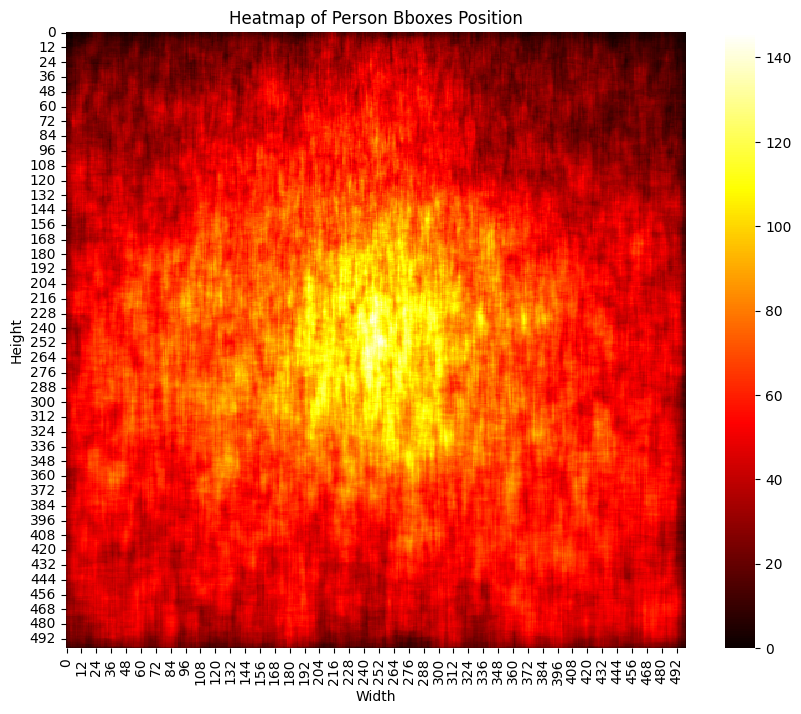

In [51]:
heatmap_person = get_bboxes_heatmap(images_with_person, specific_classes=['person'])

plot_hitmap(heatmap_person, 'Person Bboxes')

In [52]:
class_names

['bicycle', 'bus', 'car', 'motorcycle', 'person', 'truck']

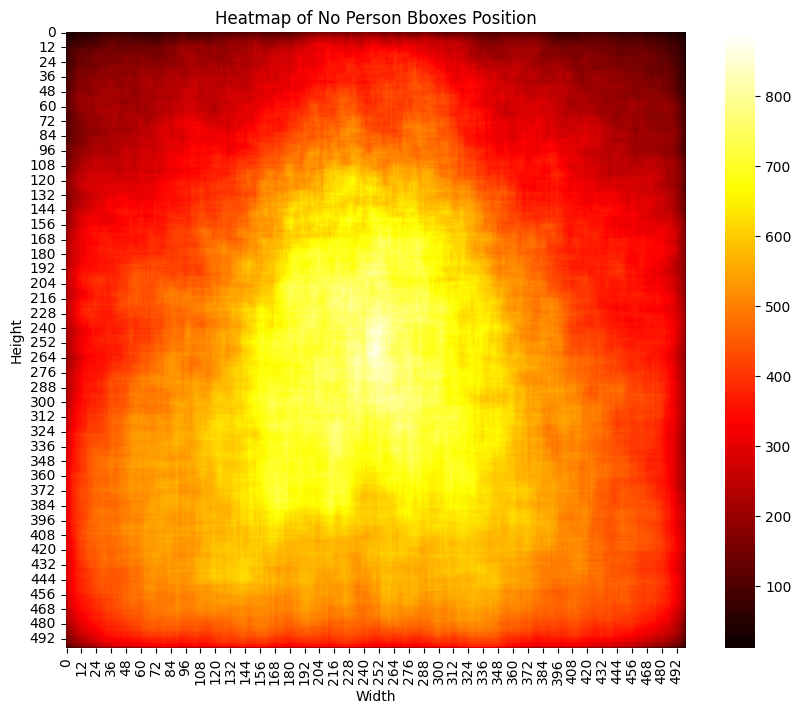

In [53]:
heatmap_no_person = get_bboxes_heatmap(images_with_person, 
                                       specific_classes=['bicycle', 'bus', 'car', 'motorcycle', 'truck'])

plot_hitmap(heatmap_no_person, 'No Person Bboxes')

Бибоксы всех классов сосредоточены в центре изображения. 

По задетектированным людям хитмап менее плотно сконцентрирован в центре, однако назвать плотность распределение бибоксов равномерным относительно всей площади фото нельзя. Это также можно учитывать при аугментации, уделив внимание смещению